# Zillow 

<hr style="border-top:10px groove DodgerBlue; margin-top: 2px; margin-bottom: 2px">

In [1]:
# Custom Module Imports
import wrangle
import model

# Standard Imports
import numpy as np
from scipy import stats
import pandas as pd
from math import sqrt
import os

### Project Goal
- My goal is to find and use key drivers of property value for single family properties sold in 2017 to predict property value with the least amount of error.

<hr style="border-top:10px groove DodgerBlue; margin-top: 2px; margin-bottom: 2px">

## Acquire and Prepare Data

<hr style="border-top:10px groove DodgerBlue; margin-top: 2px; margin-bottom: 2px">

- The function wrangle_zillow pulled the zillow data from the Codeup database via a sql query, saved it to a csv file, and prepared the data for exploration.
- The scale_data function scaled my data to be used later in the modeling phase.

In [2]:
# Reading and spliting the data into the train, validate, and test sets
train, validate, test = wrangle.wrangle_zillow()
# Creating a scaled version of the data to be used during the modeling
train_scaled, validate_scaled, test_scaled = wrangle.scale_data(train, validate, test)


### Acquire and Prepare Takeaways
- The data now has 20 columns, nulls have been dropped or replaced by 0, and the data was split into the train, validate, and test sets.
- The train, validate, and test data frames are a 60/20/20 split.

<hr style="border-top:10px groove DodgerBlue; margin-top: 2px; margin-bottom: 2px">

## Explore Data

<hr style="border-top:10px groove DodgerBlue; margin-top: 2px; margin-bottom: 2px">

### Where are the correlations in the data?

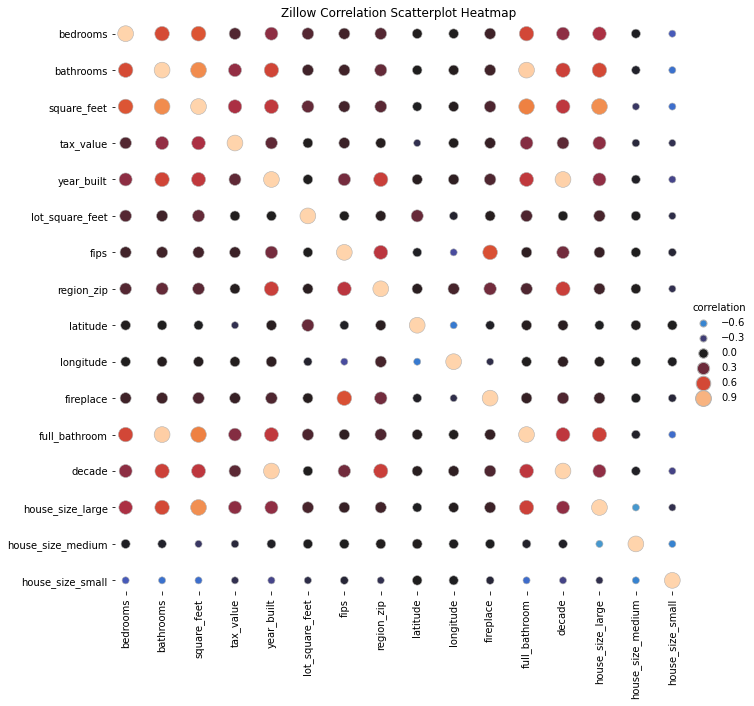

In [3]:
model.corr_heatmap(train)

### Scatterplot Heatmap Takeaways
- Tax Value has a positive correlation with house_size_large, decade, full_bathroom, year_built, square_feet, bathrooms, and bedrooms.
- Fireplace and fips has a positive correlation.
- House_size_large and full_bathroom has a positive corelation.

### Is there a relationship between Decade Built and Tax Value?

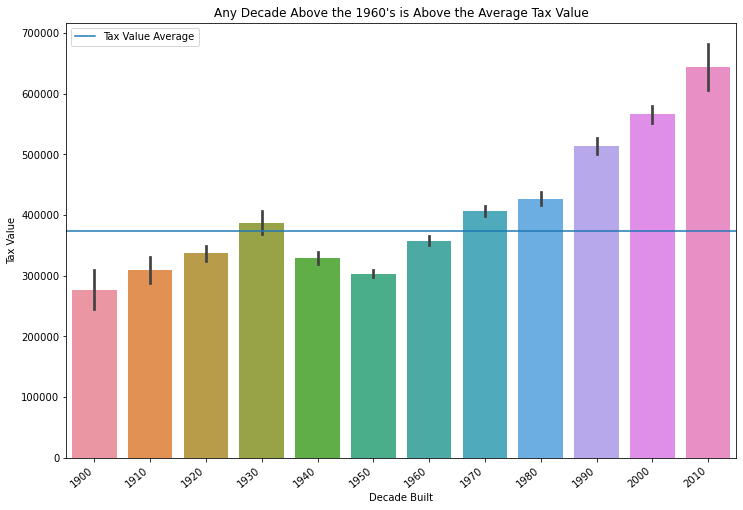

In [4]:
model.barplot(train)

### Bar Plot Takeaways
- Any decade after the 1960's is above the average Tax Value.
- There is a large jump in Tax Value from the 1870's and the 1880's.

___

### Stats Test for Bar Plot (Chi Square Test)
$H_0$:The Decade Built and Tax Value are independent.

$H_a$:There is a relationship between tax value and the Decade Built.

Alpha = 0.05


In [5]:
model.barplot_chi2(train)

We reject the null hypothesis that The Decade Built and Tax Value are independent
There is a relationship between tax value and the Decade Built
P-Value 3.9309219442730487e-16
Chi2 214095.42
Degrees of Freedom 208846


### Stats Test Takeaways
- There is in fact a relationship between Tax Value and the Decade Built

___

### Is there a relationship between Tax Value and the Year Built in LA?

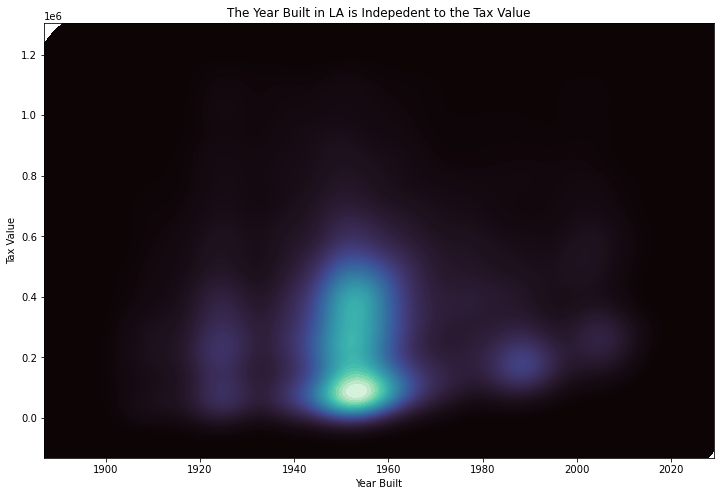

In [6]:
model.kdeplot(train)

### KDE Plot Takeaways
- In the 1950's there was lots of properties sold, espically those with lower tax values.

___

### Stats Test for KDE Plot (Chi Square Test)
$H_0$:The Year Built in LA and Tax value are independent.

$H_a$:There is a relationship between Tax Value and the Year Built in LA.

Alpha = 0.05


In [13]:
model.kdeplot_chi2(train)

We fail to reject the null hypothesis that The Year Built in LA and Tax value are independent
There appears to be no relationship between Tax Value and the Year Built in LA
P-Value 0.4721751128088897
Chi2 1454990.41
Degrees of Freedom 1454872


### Stats Test Takeaways
- There is in fact not a relationship between Tax Value and The Year Built in LA.

___

### What does the data look like on a map?

In [8]:
model.scatter_mapbox(train)

### Mapbox Takeaways
- Zipcodes 96351,96382, 96027, 96242, 96983, and 96971 are high Tax Value areas.
- There were only 12 properties sold on Santa Catalina Island.
- Properties near the beach tend to have higher Tax Values.


## Explore Takeaways
- Tax Value has a positive correlation with house_size_large, decade, full_bathroom, year_built, square_feet, bathrooms, and bedrooms.
- Any decade after the 1960's is above the average Tax Value.
- There were only 12 properties sold on Santa Catalina Island.
- Fireplaces does not apear to be useful for the modeling phase.
- Decade and the house_size columns will be used during the modeling phase.

<hr style="border-top:10px groove DodgerBlue; margin-top: 2px; margin-bottom: 2px">

## Model and Evaluate

<hr style="border-top:10px groove DodgerBlue; margin-top: 2px; margin-bottom: 2px">

### Define X and y train, val, and test datasets.


In [9]:
# Setting the features to be used in the models to a variable.
X_cols = ['bedrooms', 'bathrooms', 'square_feet', 'lot_square_feet', 'full_bathroom', 'year_built', 'fips', 'region_zip', 'house_size_large', 'house_size_small', 'decade']

# Creating the X & y version of train, validate, and test with the scaled data
# where y is a series with just the target variable and X are all the features. 
X_train = train_scaled[X_cols]
y_train = train_scaled.tax_value

X_validate = validate_scaled[X_cols]
y_validate = validate_scaled.tax_value

X_test = test_scaled[X_cols]
y_test = test_scaled.tax_value

### Baseline RMSE
- Mean of the Tax Value was used to predict the RMSE value.
- Baseline RMSE: 247730.36 

In [10]:
# We need y_train and y_validate to be dataframes to append the new columns with predicted values. 
y_train = pd.DataFrame(y_train)
y_validate = pd.DataFrame(y_validate)

model.baseline_RMSE(y_train, y_validate)

RMSE using Mean
Train/In-Sample:  247288.36 
Validate/Out-of-Sample:  249267.04


## Evaluate Top 3 Models
#### My top 3 models were:
- Lasso + Lars
- OLS using LinearRegression
- Polynomial Model

In [11]:
model.eval_models(y_train, y_validate, X_train, X_validate, X_test)

RMSE for Lasso + Lars
Training/In-Sample:  212401.75 
Validation/Out-of-Sample:  216116.17
R2 Value: 0.26
-----------------------------------------------
RMSE for OLS using LinearRegression
Training/In-Sample:  212395.09 
Validation/Out-of-Sample:  216108.91
R2 Value: 0.26
-----------------------------------------------
RMSE for Polynomial Model, degrees=2
Training/In-Sample:  204839.27 
Validation/Out-of-Sample:  208981.93
R2 Value: 0.31


### Model Takeaways
- My Polynomial Model was my best with an RMSE value of 208084.77 and a R2 value of 0.31 on the validate dataset.
- My Lasso + Lars and OLS using LinearRegression models performed similarily with an R2 of 0.26.

### Testing the best Model (Polynomial Model)


In [12]:
model.poly_test(y_test, X_train, X_test, y_train)

RMSE for Polynomial Model, degrees=2
Test/Out-of-Sample:  204854.96
R2 Value: 0.31


<hr style="border-top:10px groove DodgerBlue; margin-top: 2px; margin-bottom: 2px">

## Conclusions
- Tax Value has a positive correlation with house_size_large, decade, full_bathroom, year_built, square_feet, bathrooms, and bedrooms.
- Any decade after the 1960's is above the average Tax Value.
- Our RMSE value for our test dataset beat our baseline by 41,831.16.

### A way to further improve the our predictions would be ensuring that the data gathered didn't have as many nulls, and a catagory to select if its a certain distance away from a beach. There was an extreme amount of nulls in the data, this is definitely the best way to improve predictions.

<hr style="border-top:10px groove DodgerBlue; margin-top: 2px; margin-bottom: 2px">

## Next Steps
- If I had more time with the data I would focus on more feature engineering more columns.
- I would specifically focus more on the square feet of different areas of the property.